# **Did Somebody Say Corgi? - Dataset**

## Imports and Constants

In [43]:
import pandas as pd
from os.path import join as opjoin
import dataset_tool
import os


DATA_DIR = 'D:\\dataset'
IMAGE_DIR = 'D:\\dataset\images'
LABEL_DIR = 'D:\\dataset\labels'

In [2]:
from pathlib import Path
data = [Path(x).stem for x in os.listdir(LABEL_DIR) if Path(x).suffix == '.txt']

In [3]:
def draw_bbox(im, prediction, outline='red'):
    w, h = im.size
    
    w_ = prediction['w'] * w 
    h_ = prediction['h'] * h 
    x0 = prediction['x'] * w - w_/2
    y0 = prediction['y'] * h - h_/2
    x1 = x0 + prediction['w'] * w 
    y1 = y0 + prediction['h'] * h

    draw = ImageDraw.Draw(im)
    draw.rectangle([x0, y0, x1, y1], outline=outline, width=w//256)
    
    return im


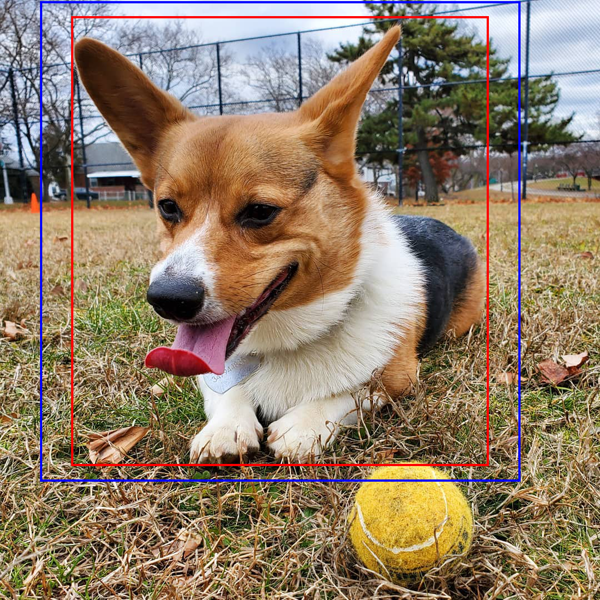
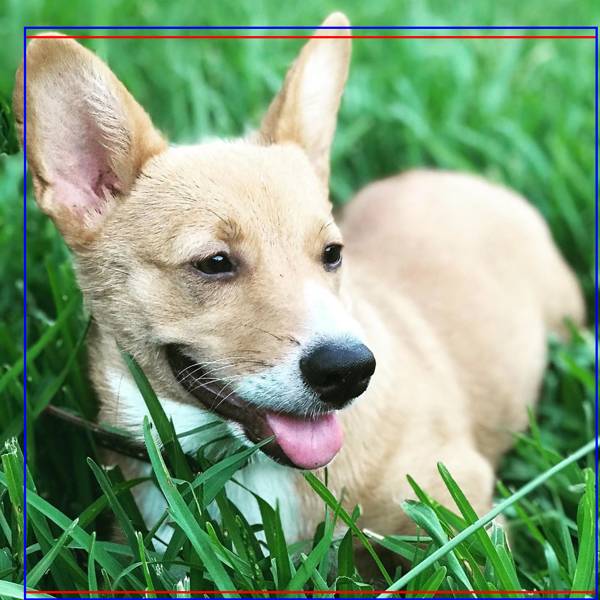
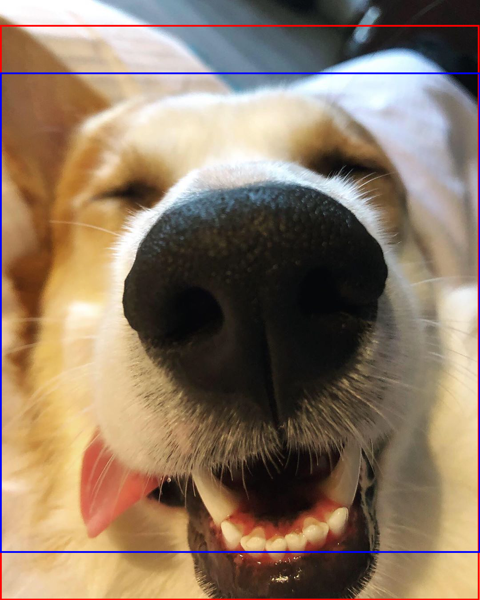
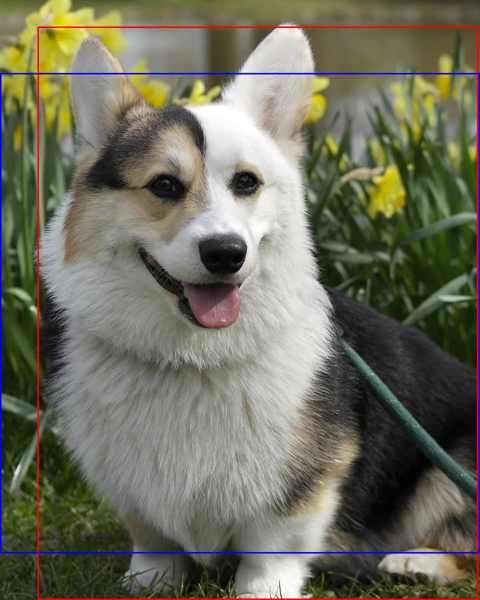
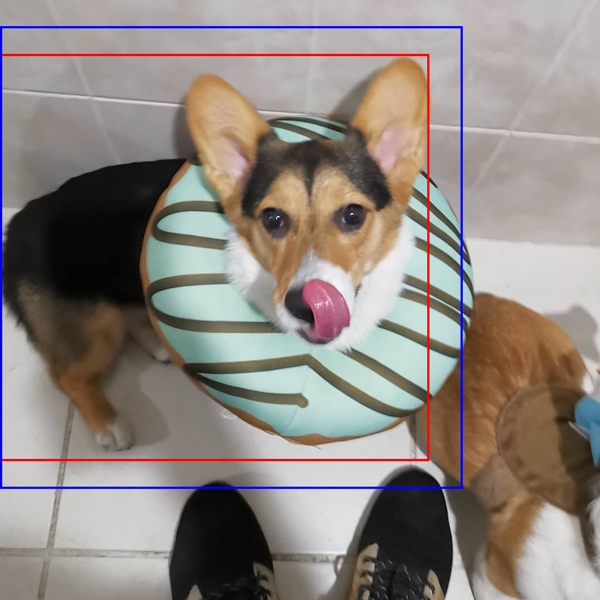
...
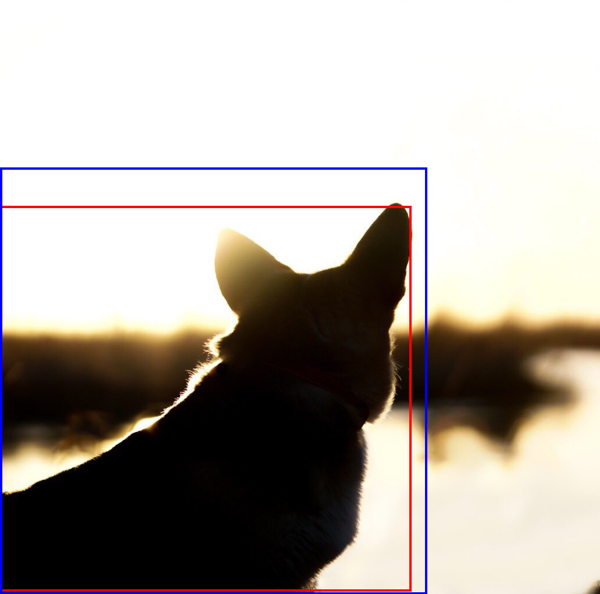
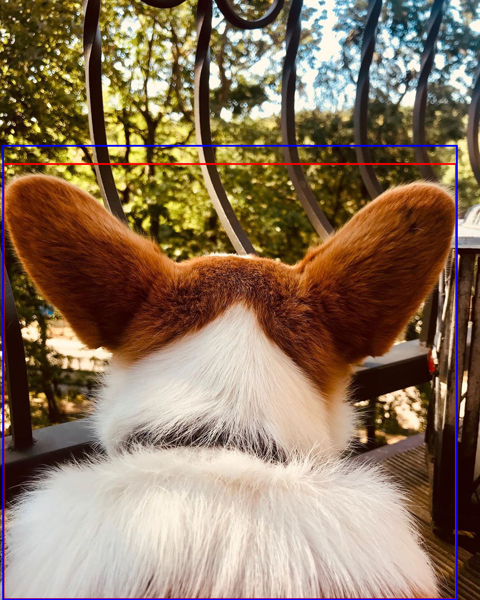
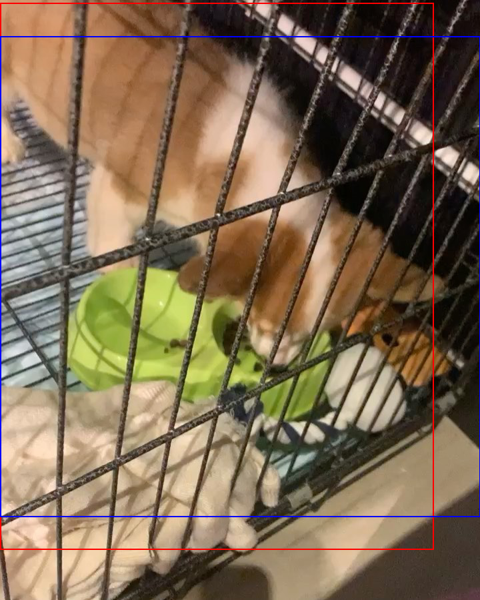
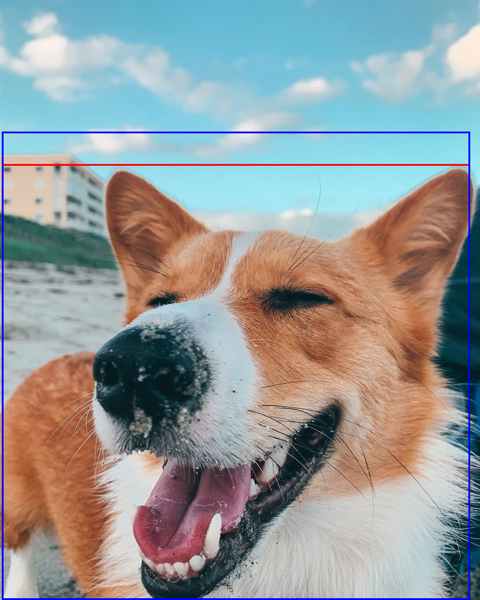
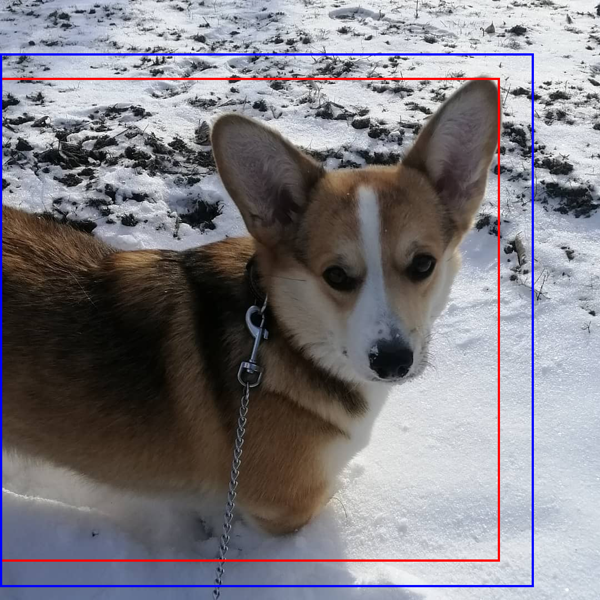

In [5]:
import random
from PIL import Image, ImageDraw
import ipyplot

num_samples = 0
ims = []
labels = []
while num_samples < 20:
    idx = random.randint(0, len(data))

    predictions = dataset_tool.parse_prediction_file(opjoin(LABEL_DIR, data[idx] + '.txt'))
    if len(predictions) != 1: continue
        
    im = Image.open(opjoin(IMAGE_DIR, data[idx] + '.jpeg'))
    draw_bbox(im, predictions[0], outline='red')
    
    w, h = im.size
    crop_box, center_shift, crop_box_size, crop_box_cover, crop_box_max_cover, is_partial_crop = dataset_tool.calculate_crop_box(w, h, predictions[0], 1024, 700, 0.8)
    if crop_box is None:
        continue
    draw_bbox(im, crop_box, outline='blue')
    
    labels.append(f'{crop_box_size}, ({center_shift[0]:0.3f}, {center_shift[1]:0.3f}), {crop_box_cover:0.3f}, {crop_box_max_cover:0.3f}, {is_partial_crop}')
    
    ims.append(im)
    num_samples += 1

ipyplot.plot_images(ims, labels=labels)

## Remove Duplicates

In [44]:
from imagededup.methods import PHash
import pickle
phasher = PHash()

# Generate encodings for all images in an image directory
encodings = phasher.encode_images(image_dir=IMAGE_DIR)
pickle.dump(encodings, open('enc.pkl', 'wb'))

2020-09-16 14:40:02,580: INFO Start: Calculating hashes...
100%|████████████████████████████████████████████████████████████████████████| 286751/286751 [1:45:20<00:00, 45.37it/s]
2020-09-16 16:25:40,095: INFO End: Calculating hashes!


In [40]:
encodings = pickle.load(open('enc.pkl', 'rb'))

In [45]:
import math
part_size = 50000
parts = math.ceil(len(encodings) / part_size)
encoding_parts = [dict(list(encodings.items())[i*part_size:(i+1)*part_size]) for i in range(parts)]

for i in range(parts):
    j = i + 1
    while j < parts:
        encodings_current = {**encoding_parts[i], **encoding_parts[j]}
        duplicates = phasher.find_duplicates(encoding_map=encodings_current)
        pickle.dump(duplicates, open(f'dup{i}{j}.pkl', 'wb'))
        j += 1

2020-09-16 16:25:40,701: INFO Start: Evaluating hamming distances for getting duplicates
2020-09-16 16:25:40,703: INFO Start: Retrieving duplicates using BKTree algorithm
 44%|███████████████████████████████                                        | 43800/100000 [3:11:18<4:05:27,  3.82it/s]


KeyboardInterrupt: 

In [55]:
duplicates = {}
from tqdm import tqdm
for key, value in tqdm(encodings.items()):
    if value not in duplicates:
        duplicates[value] = [key]
    else:
        duplicates[value] = duplicates[value] + [key]

100%|██████████████████████████████████████████████████████████████████████| 286746/286746 [00:00<00:00, 357253.58it/s]


In [58]:
Path(opjoin(IMAGE_DIR, 'removed')).mkdir()
for key, value in duplicates.items():
    if len(value) > 1:
        for file in value[1:]:
            os.rename(opjoin(IMAGE_DIR, file), opjoin(IMAGE_DIR, 'removed', file))

In [22]:
dict(list(encodings.items())[0:5])

{'-FB-0ZyMbc.jpeg': '9da4929ca1d7ce99',
 '-hisPNSMSv.jpeg': 'c79d79c31c7c438a',
 '-SDmprifMD.jpeg': 'd4872f73686c19c7',
 '05N6DhSMZR.jpeg': 'ea6627692db2ca3c',
 '0BORxdyMdb.jpeg': 'c33ee6c3c143f1e2'}

In [23]:
dict(list(encodings.items())[5:12])

{'0dObB5yMVW.jpeg': '940b31ed6398cb5f',
 '0Duu6SSMUb.jpeg': 'eec0339633730fc9',
 '0l69NISMaW.jpeg': 'd02c1b132d6e75f9',
 '0LjG4hSMRv.jpeg': 'acbc33538e8ca9d3',
 '0Q6gG5SMSS.jpeg': 'c98e2e78d187ae39',
 '0qKo8iSMWX.jpeg': 'ea94b4939699cd8e',
 '0TfPauSMfE.jpeg': '93d373c269ad581d'}

In [ ]:

    # Find duplicates using the generated encodings
    duplicates = phasher.find_duplicates(encoding_map=encodings)

    # Remove duplicates
    duplicate_keys = [key for key in duplicates.keys() if len(duplicates[key]) != 0]
    removed = 0
    for key in duplicates.keys():
        if key in duplicate_keys:
            for dup in duplicates[key]:
                try:
                    base, ext = get_base_ext(dup)
                    os.remove(os.path.join(image_dir, dup))
                    duplicate_keys.remove(dup)
                except:
                    pass
                removed += 1

    print(f'Removed {removed} duplicates')

## Todo

In [7]:
df = pd.read_csv(opjoin(DATA_DIR, 'corgioftheday_1599584150592.csv'))
df.head()

,id,shortcode,type,is_video,dimension.height,dimension.width,display_url,thumbnail_src,owner.id,description,comments,likes,comments_disabled,taken_at_timestamp,location,hashtags,mentions
0,2393762942700335318,CE4Wra0JbDW,GraphSidecar,False,1080,1080,https://scontent-muc2-1.cdninstagram.com/v/t51...,https://scontent-muc2-1.cdninstagram.com/v/t51...,12350953637,applying for Rudolph’s position today.\n.\n.\n...,1,2,False,1599578801,NaN,"[""#tuesday"",""#tongueouttuesday"",""#rudolph"",""#c...",[]
1,2393761337380787655,CE4WUDvpVXH,GraphImage,False,720,1080,https://scontent-muc2-1.cdninstagram.com/v/t51...,https://scontent-muc2-1.cdninstagram.com/v/t51...,13254881041,“Mommy’s favorite character is Rilakkuma (rela...,3,3,False,1599578610,NaN,"[""#plush"",""#furbaby"",""#rilakkuma"",""#plushlife""...",[]
2,2393759796510968400,CE4V9ospcpQ,GraphImage,False,1080,1080,https://scontent-muc2-1.cdninstagram.com/v/t51...,https://scontent-muc2-1.cdninstagram.com/v/t51...,32901676985,Time for snuggles 🐶🐶\n.\n.\n#roksi #ivy #corgi...,0,5,False,1599578426,NaN,"[""#roksi"",""#ivy"",""#corgi"",""#corgipuppy"",""#seni...",[]
3,2393758345357276969,CE4VohNJbcp,GraphSidecar,False,1080,1080,https://scontent-muc2-1.cdninstagram.com/v/t51...,https://scontent-muc2-1.cdninstagram.com/v/t51...,1262559671,Less than 2 weeks til these guys go to their n...,0,17,False,1599578253,NaN,"[""#corgi"",""#corgisofinstagram"",""#corgination"",...",[]
4,2393756772912825293,CE4VRowJ4PN,GraphSidecar,False,1080,1080,https://scontent-muc2-1.cdninstagram.com/v/t51...,https://scontent-muc2-1.cdninstagram.com/v/t51...,28976346939,J個舌頭\n好像蛇,1,7,False,1599578065,NaN,[],[]


In [47]:
df.iloc[0]

id                                                  2393753948233424841
shortcode                                                   CE4UoiEJF_J
type                                                         GraphImage
is_video                                                          False
dimension.height                                                   1350
dimension.width                                                    1080
display_url           https://scontent-muc2-1.cdninstagram.com/v/t51...
thumbnail_src         https://scontent-muc2-1.cdninstagram.com/v/t51...
owner.id                                                    32467634291
description           Hope everyone had a great (not too hot) long w...
comments                                                              6
likes                                                                 9
comments_disabled                                                 False
taken_at_timestamp                                           159

In [9]:
len(df)

115152

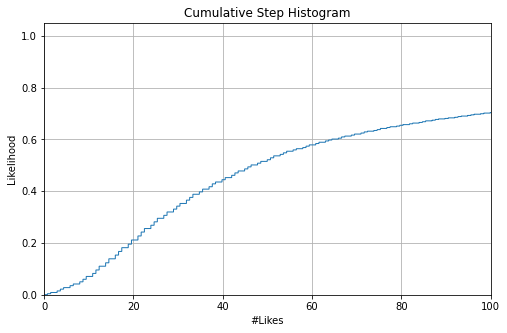

In [44]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(8, 5))
n, bins, patches = ax.hist(df['likes'], 50000, density=True, histtype='step',
                           cumulative=True)

ax.grid(True)
ax.set_xlim(0,100)
ax.set_title('Cumulative Step Histogram')
ax.set_xlabel('#Likes')
ax.set_ylabel('Likelihood')

plt.show()